In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import re
import wrangle

pd.options.display.max_colwidth = None
pd.options.display.max_columns = None
pd.options.display.max_rows = None

import warnings
warnings.filterwarnings('ignore')

plt.rc('figure', figsize=(20,10))

import nltk

# Sklearn
from sklearn.decomposition import LatentDirichletAllocation, TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import GridSearchCV
from pprint import pprint

# Plotting tools
# pip install pyLDAvis
import pyLDAvis
import pyLDAvis.sklearn

import pickle

In [2]:
hotel = wrangle.wrangle_hotel()

Using cached file...


# NLP: Topic Modeling

## SKLearn

### Positive topics

In [3]:
data = hotel.positive_lemma.tolist()

In [4]:
vectorizer = TfidfVectorizer(min_df=10,
                            stop_words='english',
                            token_pattern='[a-zA-Z0-9]{3,}',
                            ngram_range =(3,3))

In [5]:
data_vectorized = vectorizer.fit_transform(data)

In [6]:
# Build LDA Model
lda_model = LatentDirichletAllocation(n_components = 5,
                                      learning_decay = 0.7,
                                      learning_method='online',   
                                      random_state=172,
                                      n_jobs = -1)

In [7]:
lda_output = lda_model.fit_transform(data_vectorized)

In [8]:
# with open('lda_output.csv', 'wb') as f:
#     pickle.dump(lda_output, f)
    
# with open('lda_output.csv', 'rb') as f:
#     lda_output = pickle.load(f)

In [9]:
# # Materialize the sparse data
# data_dense = data_vectorized.todense()

In [10]:
# # Compute Sparsicity = Percentage of Non-Zero cells
# print("Sparsicity: ", ((data_dense > 0).sum()/data_dense.size)*100, "%")

In [11]:
# # Log Likelyhood: Higher the better
print("Log Likelihood: ", lda_model.score(data_vectorized))

Log Likelihood:  -5454152.833072026


In [12]:
# # Perplexity: Lower the better. Perplexity = exp(-1. * log-likelihood per word)
print("Perplexity: ", lda_model.perplexity(data_vectorized))

Perplexity:  30188.442757416815


In [13]:
# See model parameters
# pprint(lda_model.get_params())

In [14]:
# Create Document - Topic Matrix
lda_output = lda_model.transform(data_vectorized)

In [15]:
# column names
topicnames = ["Topic" + str(i) for i in range(lda_model.n_components)]

In [16]:
# index names
docnames = ["Doc" + str(i) for i in range(len(data))]

In [17]:
# Make the pandas dataframe
df_document_topic = pd.DataFrame(np.round(lda_output, 2), columns=topicnames, index=docnames)

In [18]:
# Get dominant topic for each document
dominant_topic = np.argmax(df_document_topic.values, axis=1)
df_document_topic['dominant_topic'] = dominant_topic

In [19]:
dom_top = pd.DataFrame(dominant_topic)
dom_top.to_csv('dominant_topic.csv')

In [20]:
# Styling
def color_green(val):
    color = 'green' if val > .1 else 'black'
    return 'color: {col}'.format(col=color)

def make_bold(val):
    weight = 700 if val > .1 else 400
    return 'font-weight: {weight}'.format(weight=weight)

In [21]:
# Apply Style
df_document_topics = df_document_topic.head(15).style.applymap(color_green).applymap(make_bold)
df_document_topics

,Topic0,Topic1,Topic2,Topic3,Topic4,dominant_topic
Doc0,0.200000,0.200000,0.200000,0.200000,0.200000,0
Doc1,0.080000,0.080000,0.670000,0.080000,0.080000,2
Doc2,0.200000,0.200000,0.200000,0.200000,0.200000,0
Doc3,0.480000,0.060000,0.200000,0.060000,0.200000,0
Doc4,0.100000,0.600000,0.100000,0.100000,0.100000,1
Doc5,0.200000,0.200000,0.200000,0.200000,0.200000,0
Doc6,0.200000,0.200000,0.200000,0.200000,0.200000,0
Doc7,0.100000,0.100000,0.100000,0.600000,0.100000,3
Doc8,0.200000,0.200000,0.200000,0.200000,0.200000,0
Doc9,0.600000,0.210000,0.060000,0.060000,0.060000,0


In [22]:
df_document_topics

,Topic0,Topic1,Topic2,Topic3,Topic4,dominant_topic
Doc0,0.200000,0.200000,0.200000,0.200000,0.200000,0
Doc1,0.080000,0.080000,0.670000,0.080000,0.080000,2
Doc2,0.200000,0.200000,0.200000,0.200000,0.200000,0
Doc3,0.480000,0.060000,0.200000,0.060000,0.200000,0
Doc4,0.100000,0.600000,0.100000,0.100000,0.100000,1
Doc5,0.200000,0.200000,0.200000,0.200000,0.200000,0
Doc6,0.200000,0.200000,0.200000,0.200000,0.200000,0
Doc7,0.100000,0.100000,0.100000,0.600000,0.100000,3
Doc8,0.200000,0.200000,0.200000,0.200000,0.200000,0
Doc9,0.600000,0.210000,0.060000,0.060000,0.060000,0


In [23]:
df_topic_distribution = df_document_topic['dominant_topic'].value_counts().reset_index(name="Num Documents")

In [24]:
df_topic_distribution.columns = ['Topic Num', 'Num Documents']
df_topic_distribution

,Topic Num,Num Documents
0,0,263878
1,1,66408
2,2,63178
3,3,61392
4,4,60882


In [25]:
pyLDAvis.enable_notebook()
panel = pyLDAvis.sklearn.prepare(lda_model, data_vectorized, vectorizer, mds='tsne')
panel

/opt/homebrew/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/homebrew/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/homebrew/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/homebrew/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/homebrew/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: Deprecatio

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
1      150.222153  -72.269554       1        1  20.586095
2       51.163364 -159.968018       2        1  20.094495
4      -73.144554   21.523815       3        1  20.036104
3      -66.410133 -110.606438       4        1  19.833151
0       54.417324   12.443444       5        1  19.450156, topic_info=                               Term         Freq        Total Category  \
9046         friendly helpful staff  2318.000000  2318.000000  Default   
24649        staff friendly helpful  3189.000000  3189.000000  Default   
14901       location friendly staff  1570.000000  1570.000000  Default   
24928        staff helpful friendly  1218.000000  1218.000000  Default   
10477              good value money   886.000000   886.000000  Default   
24833          staff great location   803.000000   803.000000  Default   
12839          hotel great location   802.000000   802.000000  Default   
24510       staff extremely helpful   798.000000   798.000000  Default   
10994       great location friendly   693.000000   693.000000  Default   
9285            friendly staff good   671.000000   671.000000  Default   
21477        room clean comfortable   652.000000   652.000000  Default   
11874        helpful friendly staff   656.000000   656.000000  Default   
9288           friendly staff great   572.000000   572.000000  Default   
15130          location great staff   554.000000   554.000000  Default   
25420         staff really friendly   546.000000   546.000000  Default   
21600          room comfortable bed   546.000000   546.000000  Default   
24766           staff good location   555.000000   555.000000  Default   
1561           bed comfortable room   532.000000   532.000000  Default   
15286    location location location   518.000000   518.000000  Default   
15174        location helpful staff   516.000000   516.000000  Default   
25423          staff really helpful   503.000000   503.000000  Default   
21968                room good size   492.000000   492.000000  Default   
12791           hotel good location   473.000000   473.000000  Default   
21914           room friendly staff   477.000000   477.000000  Default   
4076         clean comfortable room   466.000000   466.000000  Default   
11494             great value money   473.000000   473.000000  Default   
9247           friendly staff clean   459.000000   459.000000  Default   
11004          great location great   455.000000   455.000000  Default   
24508      staff extremely friendly   461.000000   461.000000  Default   
9983         good location friendly   426.000000   426.000000  Default   
24928        staff helpful friendly  1217.706139  1218.481827   Topic1   
24766           staff good location   554.361232   555.135890   Topic1   
15174        location helpful staff   515.677599   516.444100   Topic1   
25423          staff really helpful   502.571387   503.343691   Topic1   
24508      staff extremely friendly   460.510677   461.281727   Topic1   
13393          hotel staff friendly   416.387699   417.164580   Topic1   
9035          friendly helpful room   411.306659   412.080682   Topic1   
15879       location staff friendly   402.836237   403.608093   Topic1   
24697           staff friendly room   399.291930   400.063978   Topic1   
16017     location walking distance   395.934938   396.706067   Topic1   
1674      bed extremely comfortable   394.765491   395.537478   Topic1   
1914               bed really comfy   388.330311   389.100862   Topic1   
25278            staff nice helpful   383.614958   384.386654   Topic1   
25580          staff super friendly   381.872676   382.644833   Topic1   
11000           great location good   380.319398   381.093770   Topic1   
12167            helpful staff good   371.880351   372.658410   Topic1   
4866            close train station   363.053447   363.824227   Topic1   

In [26]:
# Topic-Keyword Matrix
df_topic_keywords = pd.DataFrame(lda_model.components_)

In [27]:
# Assign Column and Index
df_topic_keywords.columns = vectorizer.get_feature_names()
df_topic_keywords.index = topicnames

In [28]:
# View
df_topic_keywords.head()

,100 meter away,100 meter hotel,100 metre away,100 recommend hotel,10min walking distance,10th wedding anniversary,15th floor lounge,17th floor bar,1st floor room,200 meter away,20th wedding anniversary,25th wedding anniversary,2nd stay hotel,2nd time hotel,2nd time stayed,2nd time staying,30th wedding anniversary,360 degree view,3rd stay hotel,3rd time hotel,3rd time stayed,40th wedding anniversary,4th floor room,5min walk away,5min walk metro,5mins walking distance,5th floor room,6th floor good,6th floor great,6th floor room,7th floor amazing,7th floor bar,7th floor great,7th floor nice,7th floor room,7th floor view,8th floor nice,8th floor room,8th floor view,9th floor room,9th floor view,abbey big ben,abbey buckingham palace,abbey london eye,able accommodate request,able answer question,able book early,able check earlier,able check early,able check hour,able check room,able early check,able leave bag,able leave car,able leave case,able leave luggage,able leave suitcase,able open window,able park car,able store luggage,able walk place,absolute pleasure stay,absolutely amazing hotel,absolutely amazing staff,absolutely beautiful hotel,absolutely beautiful staff,absolutely brilliant staff,absolutely fantastic hotel,absolutely fantastic location,absolutely fantastic staff,absolutely fantastic stay,absolutely great location,absolutely love hotel,absolutely loved hotel,absolutely loved location,absolutely loved place,absolutely loved room,absolutely loved stay,absolutely lovely hotel,absolutely perfect location,absolutely perfect staff,absolutely recommend hotel,absolutely stunning hotel,absolutely wonderful staff,access airport bus,access airport city,access airport train,access bus tube,access canary wharf,access central amsterdam,access central london,access central station,access centre london,access centre tram,access city center,access city centre,access club lounge,access earl court,access executive lounge,access free wifi,access friendly staff,access gare nord,access heathrow airport,access hop hop,access hyde park,access london attraction,access london city,access main attraction,access major attraction,access metro bus,access metro city,access metro line,access metro station,access metro train,access metro walking,access old town,access oxford street,access paddington station,access public transport,access public transportation,access rest city,access rest london,access tourist attraction,access train metro,access train station,access tram city,access tube bus,access tube line,access tube station,access underground bus,access underground station,access victoria station,access west end,accessible public transport,accessible public transportation,accommodate early check,accommodated early check,accommodating breakfast good,accommodating definitely stay,accommodating friendly room,accommodating friendly staff,accommodating great location,accommodating location excellent,accommodating location great,accommodating location perfect,accommodating room clean,accommodating room comfortable,accommodating room spacious,accommodating staff clean,accommodating staff excellent,accommodating staff good,accommodating staff great,accommodating staff lovely,accommodation excellent location,accommodation friendly staff,accommodation good location,accommodation great location,accommodation staff helpful,accor hotel arena,added bonus hotel,added bonus staff,adequate night stay,adequate short stay,adequate staff friendly,afternoon nice touch,afternoon tea cake,afternoon tea good,afternoon tea great,afternoon tea lovely,afternoon tea staff,air condition good,air condition room,air conditioned room,air conditioner room,air conditioner worked,air conditioning bonus,air conditioning breakfast,air conditioning comfortable,air conditioning effective,air conditioning excellent,air conditioning free,air conditioning friendly,air conditioning good,air conditioning great,air conditioning hot,air conditioning hotel,air conditioning location,air conditi

In [29]:
# Show top n keywords for each topic
def show_topics(vectorizer=vectorizer, lda_model=lda_model, n_words=20):
    keywords = np.array(vectorizer.get_feature_names())
    topic_keywords = []
    for topic_weights in lda_model.components_:
        top_keyword_locs = (-topic_weights).argsort()[:n_words]
        topic_keywords.append(keywords.take(top_keyword_locs))
    return topic_keywords

In [30]:
topic_keywords = show_topics(vectorizer=vectorizer, lda_model=lda_model, n_words=15)        

In [31]:
# Topic - Keywords Dataframe
df_topic_keywords = pd.DataFrame(topic_keywords)
df_topic_keywords.columns = ['Word '+str(i) for i in range(df_topic_keywords.shape[1])]
df_topic_keywords.index = ['Topic '+str(i) for i in range(df_topic_keywords.shape[0])]
df_topic_keywords

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14
Topic 0,staff great location,hotel great location,room clean comfortable,hotel good location,clean comfortable room,good location friendly,great location staff,helpful staff great,room spacious clean,good location close,room comfy bed,great location clean,staff excellent location,location good staff,bed comfortable staff
Topic 1,staff helpful friendly,staff friendly helpful,staff good location,location helpful staff,staff really helpful,staff extremely friendly,hotel staff friendly,friendly helpful room,location staff friendly,staff friendly room,location walking distance,bed extremely comfortable,bed really comfy,staff nice helpful,staff super friendly
Topic 2,staff friendly helpful,location great staff,room comfortable bed,room good size,friendly staff clean,staff good breakfast,close metro station,bed really comfortable,close tube station,room comfortable clean,staff clean room,great staff friendly,excellent staff friendly,great location near,great staff helpful
Topic 3,friendly helpful staff,good value money,staff extremely helpful,friendly staff good,room friendly staff,location friendly helpful,bed super comfy,great location nice,clean staff friendly,location good breakfast,bed extra comfy,bed comfy room,room good breakfast,clean friendly staff,breakfast good location
Topic 4,location friendly staff,great location friendly,helpful friendly staff,friendly staff great,staff really friendly,bed comfortable room,location location location,great value money,great location great,location excellent staff,hotel friendly staff,good location nice,staff polite helpful,excellent location friendly,room great location


In [32]:
df_topic_keywords.to_csv('pos_topic_keyword.csv')

In [33]:
# Construct the k-means clusters
from sklearn.cluster import KMeans
clusters = KMeans(n_clusters=15, random_state=100).fit_predict(lda_output)

In [34]:
# Build the Singular Value Decomposition(SVD) model
svd_model = TruncatedSVD(n_components=2)  # 2 components

In [35]:
lda_output_svd = svd_model.fit_transform(lda_output)

In [36]:
# X and Y axes of the plot using SVD decomposition
x = lda_output_svd[:, 0]
y = lda_output_svd[:, 1]

In [37]:
# Weights for the 15 columns of lda_output, for each component
print("Component's weights: \n", np.round(svd_model.components_, 2))

# Percentage of total information in 'lda_output' explained by the two components
print("Perc of Variance Explained: \n", np.round(svd_model.explained_variance_ratio_, 2))

Component's weights: 
 [[ 0.44  0.45  0.45  0.45  0.45]
 [-0.11  0.85 -0.16 -0.11 -0.48]]
Perc of Variance Explained: 
 [0.   0.26]


Text(0.5, 1.0, 'Segregation of Topic Clusters')

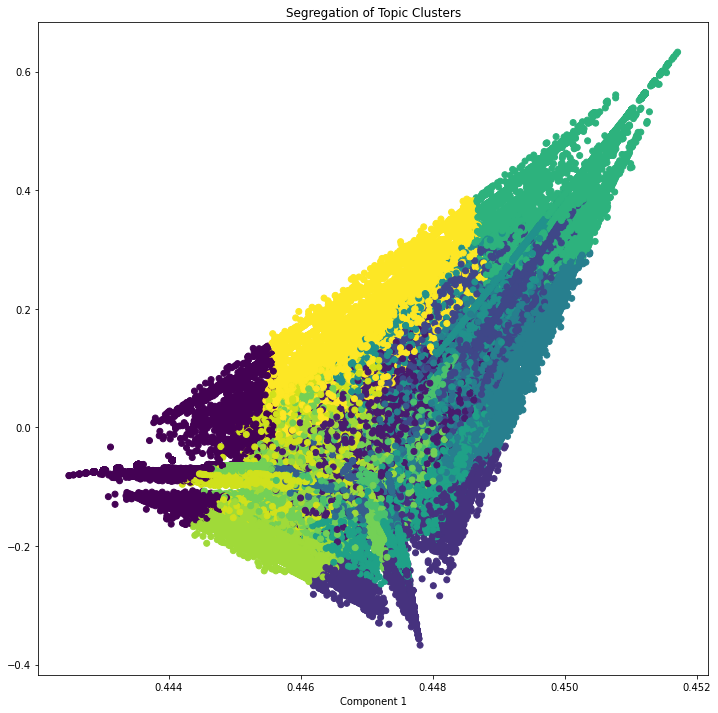

In [38]:
# Plot
plt.figure(figsize=(12, 12))
plt.scatter(x, y, c=clusters)
plt.xlabel('Component 2')
plt.xlabel('Component 1')
plt.title("Segregation of Topic Clusters", )


### Negative Topics

In [39]:
negative_data = hotel.negative_lemma.tolist()

In [40]:
negative_vectorizer = TfidfVectorizer(min_df=10,
                             stop_words='english',
                             token_pattern='[a-zA-Z0-9]{3,}',
                                     ngram_range =(3,3))

In [41]:
negative_data_vectorized = negative_vectorizer.fit_transform(negative_data)

In [42]:
#Build LDA Model
negative_lda_model = LatentDirichletAllocation(n_components = 5,
                                               learning_decay = 0.7,
                                               learning_method='online',   
                                               random_state=172,
                                               n_jobs = -1)

In [43]:
negative_lda_output = negative_lda_model.fit_transform(negative_data_vectorized)

In [44]:
# with open('negative_lda_output.csv', 'wb') as f:
#     pickle.dump(negative_lda_output, f)
    
# with open('negative_lda_output.csv', 'rb') as f:
#     negative_lda_output = pickle.load(f)

In [45]:
# # Materialize the sparse data
# negative_data_dense = negative_data_vectorized.todense()

In [46]:
# # Compute Sparsicity = Percentage of Non-Zero cells
# print("Sparsicity: ", ((negative_data_dense > 0).sum()/negative_data_dense.size)*100, "%")

In [47]:
# # Log Likelyhood: Higher the better
print("Log Likelihood: ", negative_lda_model.score(negative_data_vectorized))

Log Likelihood:  -1793174.971306563


In [48]:
# # Perplexity: Lower the better. Perplexity = exp(-1. * log-likelihood per word)
print("Perplexity: ", negative_lda_model.perplexity(negative_data_vectorized))

Perplexity:  13218.504451213304


In [49]:
# # See model parameters
pprint(negative_lda_model.get_params())

{'batch_size': 128,
 'doc_topic_prior': None,
 'evaluate_every': -1,
 'learning_decay': 0.7,
 'learning_method': 'online',
 'learning_offset': 10.0,
 'max_doc_update_iter': 100,
 'max_iter': 10,
 'mean_change_tol': 0.001,
 'n_components': 5,
 'n_jobs': -1,
 'perp_tol': 0.1,
 'random_state': 172,
 'topic_word_prior': None,
 'total_samples': 1000000.0,
 'verbose': 0}


In [50]:
# Create Document - Topic Matrix
negative_lda_output = negative_lda_model.transform(negative_data_vectorized)

In [51]:
# column names
negative_topicnames = ["Topic" + str(i) for i in range(negative_lda_model.n_components)]

In [52]:
# index names
negative_docnames = ["Doc" + str(i) for i in range(len(negative_data))]

In [53]:
# Make the pandas dataframe
negative_df_document_topic = pd.DataFrame(np.round(negative_lda_output, 2), columns=negative_topicnames, index=negative_docnames)

In [54]:
# negative_lda_output.head()

In [55]:
# Get dominant topic for each document
negative_dominant_topic = np.argmax(negative_df_document_topic.values, axis=1)
negative_df_document_topic['dominant_topic'] = negative_dominant_topic

In [56]:
negative_dom_top = pd.DataFrame(negative_dominant_topic)
negative_dom_top.to_csv('negative_dominant_topic.csv')

In [57]:
# Styling
def color_green(val):
    color = 'green' if val > .1 else 'black'
    return 'color: {col}'.format(col=color)

def make_bold(val):
    weight = 700 if val > .1 else 400
    return 'font-weight: {weight}'.format(weight=weight)

In [58]:
# Apply Style
negative_df_document_topics = negative_df_document_topic.head(15).style.applymap(color_green).applymap(make_bold)
negative_df_document_topics

,Topic0,Topic1,Topic2,Topic3,Topic4,dominant_topic
Doc0,0.100000,0.100000,0.100000,0.100000,0.600000,4
Doc1,0.200000,0.200000,0.200000,0.200000,0.200000,0
Doc2,0.200000,0.200000,0.200000,0.200000,0.200000,0
Doc3,0.200000,0.200000,0.200000,0.200000,0.200000,0
Doc4,0.200000,0.200000,0.200000,0.200000,0.200000,0
Doc5,0.200000,0.200000,0.200000,0.200000,0.200000,0
Doc6,0.100000,0.100000,0.600000,0.100000,0.100000,2
Doc7,0.200000,0.200000,0.200000,0.200000,0.200000,0
Doc8,0.080000,0.330000,0.080000,0.080000,0.420000,4
Doc9,0.200000,0.200000,0.200000,0.200000,0.200000,0


In [59]:
negative_df_topic_distribution = negative_df_document_topic['dominant_topic'].value_counts().reset_index(name="Num Documents")

In [60]:
negative_df_topic_distribution.columns = ['Topic Num', 'Num Documents']
negative_df_topic_distribution

,Topic Num,Num Documents
0,0,398694
1,1,29991
2,2,29287
3,3,29030
4,4,28736


In [61]:
pyLDAvis.enable_notebook()
negative_panel = pyLDAvis.sklearn.prepare(negative_lda_model, negative_data_vectorized, negative_vectorizer, mds='tsne')
negative_panel

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
3      150.222153  -72.269554       1        1  20.300746
1       51.163364 -159.968018       2        1  20.054252
2      -73.144554   21.523815       3        1  20.037006
0      -66.410133 -110.606438       4        1  19.879914
4       54.417324   12.443444       5        1  19.728081, topic_info=                             Term         Freq        Total Category  logprob  \
7087               room bit small  1111.000000  1111.000000  Default  30.0000   
7665            room little small   885.000000   885.000000  Default  29.0000   
7913             room quite small   719.000000   719.000000  Default  28.0000   
2226       coffee making facility   462.000000   462.000000  Default  27.0000   
5266         making facility room   442.000000   442.000000  Default  26.0000   
1541     breakfast included price   432.000000   432.000000  Default  25.0000   
10225           tea coffee making   417.000000   417.000000  Default  24.0000   
10220         tea coffee facility   394.000000   394.000000  Default  23.0000   
151         air conditioning room   372.000000   372.000000  Default  22.0000   
10232             tea coffee room   368.000000   368.000000  Default  21.0000   
7375         room extremely small   292.000000   292.000000  Default  20.0000   
2209         coffee facility room   280.000000   280.000000  Default  19.0000   
172         air conditioning work   277.000000   277.000000  Default  18.0000   
10247         tea making facility   278.000000   278.000000  Default  17.0000   
7974            room really small   270.000000   270.000000  Default  16.0000   
3288              far city center   261.000000   261.000000  Default  15.0000   
8220          room small bathroom   252.000000   252.000000  Default  14.0000   
7645              room little bit   252.000000   252.000000  Default  13.0000   
3707             good value money   254.000000   254.000000  Default  12.0000   
8221               room small bed   249.000000   249.000000  Default  11.0000   
8189              room size small   227.000000   227.000000  Default  10.0000   
8104            room service menu   226.000000   226.000000  Default   9.0000   
174      air conditioning working   225.000000   225.000000  Default   8.0000   
8086            room service food   211.000000   211.000000  Default   7.0000   
799               bed little hard   204.000000   204.000000  Default   6.0000   
1161           booked booking com   203.000000   203.000000  Default   5.0000   
5386                mini bar room   198.000000   198.000000  Default   4.0000   
6938        room air conditioning   194.000000   194.000000  Default   3.0000   
8411        room smaller expected   194.000000   194.000000  Default   2.0000   
4892             little bit small   189.000000   189.000000  Default   1.0000   
7087               room bit small  1110.301783  1111.043016   Topic1  -3.5424   
7913             room quite small   718.977731   719.719998   Topic1  -3.9770   
2226       coffee making facility   461.854013   462.594936   Topic1  -4.4196   
5266         making facility room   441.918745   442.659391   Topic1  -4.4637   
10225           tea coffee making   416.828788   417.569738   Topic1  -4.5221   
10232             tea coffee room   367.687228   368.430295   Topic1  -4.6476   
7375         room extremely small   292.197377   292.941071   Topic1  -4.8774   
10247         tea making facility   277.270118   278.011140   Topic1  -4.9298   
3707             good value money   253.282783   254.027984   Topic1  -5.0203   
8086            room service food   210.694554   211.437384   Topic1  -5.2044   
4998             location bit far   168.703615   169.451668   Topic1  -5.4267   
8345             room small price   159.816553   160.557621   Topic1  -5.4808   
9726       staff friendly helpful   148.408849   149.152232   Topic1

In [62]:
# Topic-Keyword Matrix
negative_df_topic_keywords = pd.DataFrame(negative_lda_model.components_)

In [63]:
# Assign Column and Index
negative_df_topic_keywords.columns = negative_vectorizer.get_feature_names()
negative_df_topic_keywords.index = negative_topicnames

In [64]:
# View
negative_df_topic_keywords.head()

,100 euro deposit,100 euro night,150 euro deposit,150 euro night,1st floor room,200 euro night,200 night room,200 pound night,24hr room service,250 euro night,2nd floor hear,2nd floor room,2pm room ready,300 euro night,30am sunday morning,350 euro night,3pm room ready,3rd floor lift,3rd floor room,400 euro night,4pm room ready,4th floor lift,4th floor room,500 euro night,5th floor lift,5th floor room,6th floor hear,6th floor room,7th floor room,8am sunday morning,abandoned building hotel,able change room,able check early,able make coffee,able make cup,able make tea,able open window,able sleep night,able stay longer,able walk bed,absolutely tiny room,accept credit card,acceptable star hotel,access car park,access club lounge,access executive lounge,access free wifi,access public transport,accessible public transport,accident waiting happen,accused smoking room,actually single bed,actually single pushed,add insult injury,add service charge,added service charge,additional charge breakfast,additional cost breakfast,additional service charge,adequate night stay,adequate short stay,adequate star hotel,adjoining door room,adjoining room door,adjust room temperature,adjust temperature room,adult child room,adult year old,advertised air conditioning,advertised booking com,advertised free wifi,advertised star hotel,air air conditioning,air bit noisy,air broken room,air circulation room,air condition cold,air condition good,air condition hot,air condition hotel,air condition noisy,air condition poor,air condition room,air condition unit,air condition work,air condition working,air conditioned room,air conditioner broken,air conditioner cool,air conditioner hot,air conditioner loud,air conditioner noisy,air conditioner room,air conditioner turned,air conditioner unit,air conditioner work,air conditioner working,air conditioning air,air conditioning appear,air conditioning available,air conditioning bad,air conditioning bathroom,air conditioning bedroom,air conditioning better,air conditioning bit,air conditioning blew,air conditioning breakfast,air conditioning broke,air conditioning broken,air conditioning came,air conditioning cold,air conditioning control,air conditioning controlled,air conditioning cool,air conditioning cooling,air conditioning didnt,air conditioning difficult,air conditioning effective,air conditioning efficient,air conditioning extremely,air conditioning fan,air conditioning fixed,air conditioning functioning,air conditioning good,air conditioning great,air conditioning hard,air conditioning heat,air conditioning heating,air conditioning hot,air conditioning hotel,air conditioning impossible,air conditioning inadequate,air conditioning ineffective,air conditioning issue,air conditioning kept,air conditioning little,air conditioning lot,air conditioning loud,air conditioning machine,air conditioning make,air conditioning need,air conditioning needed,air conditioning night,air conditioning noise,air conditioning noisy,air conditioning open,air conditioning operating,air conditioning poor,air conditioning problem,air conditioning quite,air conditioning really,air conditioning room,air conditioning set,air conditioning sleep,air conditioning small,air conditioning strong,air conditioning summer,air conditioning switched,air conditioning temperature,air conditioning terrible,air conditioning time,air conditioning turn,air conditioning turned,air conditioning uncomfortable,air conditioning unit,air conditioning vent,air conditioning ventilation,air conditioning warm,air conditioning wasnt,air conditioning weak,air conditioning window,air conditioning winter,air conditioning work,air conditioning worked,air conditioning working,air cool room,air didnt work,air freshener room,air little noisy,air open window,air room hot,air room noisy,air room window,air room work,air room working,air unit outside,air unit room,air window open,air work hot,air work properly,air work room,air working properly,air working room,aircon didnt w

In [65]:
# Show top n keywords for each topic
def show_topics(vectorizer=negative_vectorizer, lda_model=negative_lda_model, n_words=20):
    keywords = np.array(negative_vectorizer.get_feature_names())
    topic_keywords = []
    for topic_weights in negative_lda_model.components_:
        top_keyword_locs = (-topic_weights).argsort()[:n_words]
        topic_keywords.append(keywords.take(top_keyword_locs))
    return topic_keywords

In [66]:
negative_topic_keywords = show_topics(vectorizer=negative_vectorizer, lda_model=negative_lda_model, n_words=15)        

In [67]:
# Topic - Keywords Dataframe
negative_df_topic_keywords = pd.DataFrame(negative_topic_keywords)
negative_df_topic_keywords.columns = ['Word '+str(i) for i in range(negative_df_topic_keywords.shape[1])]
negative_df_topic_keywords.index = ['Topic '+str(i) for i in range(negative_df_topic_keywords.shape[0])]
negative_df_topic_keywords

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14
Topic 0,room really small,room air conditioning,took long time,size room small,double bed single,room double bed,single bed pushed,single room small,breakfast bit expensive,bottle water room,booked double room,breakfast room small,bathroom bit small,room little tired,non smoking room
Topic 1,room little small,breakfast included price,room small bathroom,room little bit,room size small,room service menu,mini bar room,little bit small,good night sleep,small room small,little bit far,iron ironing board,wait long time,room sound proof,bar closed early
Topic 2,tea coffee facility,coffee facility room,air conditioning work,room small bed,air conditioning working,room smaller expected,bed bit hard,coffee machine room,room ground floor,breakfast included room,poor value money,water pressure shower,ground floor room,small room bathroom,room far small
Topic 3,room bit small,room quite small,coffee making facility,making facility room,tea coffee making,tea coffee room,room extremely small,tea making facility,good value money,room service food,location bit far,room small price,staff friendly helpful,ordered room service,room hot air
Topic 4,air conditioning room,far city center,bed little hard,booked booking com,far city centre,king size bed,air conditioning unit,hot water shower,room bathroom small,free wifi room,room small room,bit far city,booking booking com,included room rate,expect star hotel


In [68]:
neg_top_key = pd.DataFrame(negative_df_topic_keywords)
neg_top_key.to_csv('negative_topic_keywords.csv')

In [69]:
# Construct the k-means clusters
from sklearn.cluster import KMeans
negative_clusters = KMeans(n_clusters=15, random_state=100).fit_predict(negative_lda_output)

In [70]:
# Build the Singular Value Decomposition(SVD) model
negative_svd_model = TruncatedSVD(n_components=2)  # 2 components
negative_lda_output_svd = negative_svd_model.fit_transform(negative_lda_output)

In [71]:
# X and Y axes of the plot using SVD decomposition
negative_x = negative_lda_output_svd[:, 0]
negative_y = negative_lda_output_svd[:, 1]

In [72]:
# Weights for the 15 columns of lda_output, for each component
print("Component's weights: \n", np.round(negative_svd_model.components_, 2))

# Percentage of total information in 'lda_output' explained by the two components
print("Perc of Variance Explained: \n", np.round(negative_svd_model.explained_variance_ratio_, 2))

Component's weights: 
 [[ 0.45  0.45  0.45  0.45  0.45]
 [-0.08 -0.46 -0.12  0.85 -0.2 ]]
Perc of Variance Explained: 
 [0.   0.26]


Text(0.5, 1.0, 'Segregation of Topic Clusters')

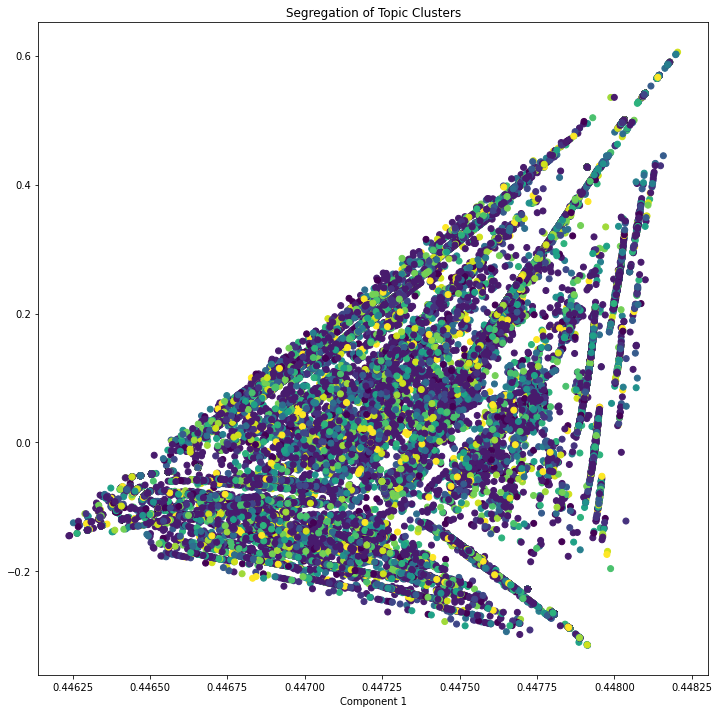

In [73]:
# Plot
plt.figure(figsize=(12, 12))
plt.scatter(negative_x, negative_y, c=clusters)
plt.xlabel('Component 2')
plt.xlabel('Component 1')
plt.title("Segregation of Topic Clusters", )

## Positive Grid Search

In [ ]:
# Define Search Param
search_params = {'n_components': [5], 'learning_decay':[0.5,0.7,0.9]}

# Init the Model
lda = LatentDirichletAllocation(learning_method='online',
                                random_state=172,
                                n_jobs = -1)
    
# Init Grid Search Class
positive_model = GridSearchCV(lda, param_grid=search_params)
    
# Do the Grid Search
positive_model.fit(data_vectorized)

In [ ]:
# Best Model
best_positive_lda_model = model.best_estimator_

# Model Parameters
print("Best Model's Params: ", model.best_params_)

# Log Likelihood Score
print("Best Log Likelihood Score: ", model.best_score_)

# Perplexity
print("Model Perplexity: ", best_lda_model.perplexity(data_vectorized))

In [ ]:
# Get Log Likelyhoods from Grid Search Output
n_topics = [5]
log_likelyhoods_5 = [round(gscore.mean_validation_score) for gscore in positive_model.grid_scores_ if gscore.parameters['learning_decay']==0.5]
log_likelyhoods_7 = [round(gscore.mean_validation_score) for gscore in positive_model.grid_scores_ if gscore.parameters['learning_decay']==0.7]
log_likelyhoods_9 = [round(gscore.mean_validation_score) for gscore in positive_model.grid_scores_ if gscore.parameters['learning_decay']==0.9]

# Show graph
plt.figure(figsize=(12, 8))
plt.plot(n_topics, log_likelyhoods_5, label='0.5')
plt.plot(n_topics, log_likelyhoods_7, label='0.7')
plt.plot(n_topics, log_likelyhoods_9, label='0.9')
plt.title("Choosing Optimal LDA Model")
plt.xlabel("Num Topics")
plt.ylabel("Log Likelyhood Scores")
plt.legend(title='Learning decay', loc='best')
plt.show()

## Negative Grid Search

In [ ]:
# Define Search Param
search_params = {'n_components': [5],'learning_decay':[0.5,0.7,0.9]}

# Init the Model
negative_lda = LatentDirichletAllocation(learning_method='online',   
                                         random_state=172,
                                         n_jobs = -1)

# Init Grid Search Class
negative_model = GridSearchCV(negative_lda, param_grid=search_params)

with open('negative_grid.csv', 'wb') as f:
    pickle.dump(negative_model, f)
    
with open('negative_grid.csv', 'rb') as f:
    negative_model = pickle.load(f)
    
# Do the Grid Search
negative_model.fit(negative_data_vectorized)

In [ ]:
# Best Model
best_negative_lda_model = negative_model.best_estimator_

# Model Parameters
print("Best Model's Params: ", negative_model.best_params_)

# Log Likelihood Score
print("Best Log Likelihood Score: ", negative_model.best_score_)

# Perplexity
print("Model Perplexity: ", best_negative_lda_model.perplexity(negative_data_vectorized))

In [ ]:
# Get Log Likelyhoods from Grid Search Output
n_topics = [5]
log_likelyhoods_5 = [round(gscore.mean_validation_score) for gscore in negative_model.grid_scores_ if gscore.parameters['learning_decay']==0.5]
log_likelyhoods_7 = [round(gscore.mean_validation_score) for gscore in negative_model.grid_scores_ if gscore.parameters['learning_decay']==0.7]
log_likelyhoods_9 = [round(gscore.mean_validation_score) for gscore in negative_model.grid_scores_ if gscore.parameters['learning_decay']==0.9]

# Show graph
plt.figure(figsize=(12, 8))
plt.plot(n_topics, log_likelyhoods_5, label='0.5')
plt.plot(n_topics, log_likelyhoods_7, label='0.7')
plt.plot(n_topics, log_likelyhoods_9, label='0.9')
plt.title("Choosing Optimal LDA Model")
plt.xlabel("Num Topics")
plt.ylabel("Log Likelyhood Scores")
plt.legend(title='Learning decay', loc='best')
plt.show()

# Gensim

In [ ]:
# from pprint import pprint

# # Gensim
# import gensim
# from gensim.models.ldamodel import LdaModel
# import gensim.corpora as corpora
# from gensim.utils import simple_preprocess
# from gensim.models import CoherenceModel

# # Plotting tools
# import pyLDAvis
# import pyLDAvis.gensim_models  # don't skip this

In [ ]:
# data = hotel.positive_lemma.values.tolist()

In [ ]:
# def sent_to_words(sentences):
#     for sentence in sentences:
#         yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

# data_words = list(sent_to_words(data))

# print(data_words[:1])

In [ ]:
# # Create Dictionary
# id2word = corpora.Dictionary(data_words)

# # Create Corpus
# texts = data_words

# # Term Document Frequency
# corpus = [id2word.doc2bow(text) for text in texts]

# # View
# print(corpus[:1])

In [ ]:
# id2word[0]

In [ ]:
# Human readable format of corpus (term-frequency)
# [[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

In [ ]:
# Build LDA model
# lda_model = LdaModel(corpus=corpus,id2word=id2word,
#                     num_topics=10, random_state=100)

In [ ]:
# Print the Keyword in the 10 topics
# pprint(lda_model.print_topics())
# doc_lda = lda_model[corpus]

In [ ]:
# # Compute Perplexity
# print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# # Compute Coherence Score
# coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word)
# coherence_lda = coherence_model_lda.get_coherence()
# print('\nCoherence Score: ', coherence_lda)

In [ ]:
# Visualize the topics
# pyLDAvis.enable_notebook()
# vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
# vis